<a href="https://colab.research.google.com/github/shaurya-pandey0/Crop_Yield_Prediction_Model/blob/main/NeuroNest_Data_Cleaning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Calling Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split, cross_val_score

# Importing Dataset

In [3]:
from google.colab import files
uploaded = files.upload()

Saving dataset-2-parkinson (2).csv to dataset-2-parkinson (2).csv


# Understanding the Dataset

Step 1: Lets get an overview of the data

In [5]:
# import csv file
df = pd.read_csv('dataset-2-parkinson (2).csv', encoding= 'unicode_escape')

In [13]:
df.head()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1.0,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1.0,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1.0,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1.0,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1.0,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [14]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1195 entries, 0 to 1194
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              1195 non-null   object 
 1   MDVP:Fo(Hz)       1195 non-null   float64
 2   MDVP:Fhi(Hz)      1195 non-null   float64
 3   MDVP:Flo(Hz)      1195 non-null   float64
 4   MDVP:Jitter(%)    1195 non-null   float64
 5   MDVP:Jitter(Abs)  1195 non-null   float64
 6   MDVP:RAP          1195 non-null   float64
 7   MDVP:PPQ          1195 non-null   float64
 8   Jitter:DDP        1195 non-null   float64
 9   MDVP:Shimmer      1195 non-null   float64
 10  MDVP:Shimmer(dB)  1195 non-null   float64
 11  Shimmer:APQ3      1195 non-null   float64
 12  Shimmer:APQ5      1195 non-null   float64
 13  MDVP:APQ          1195 non-null   float64
 14  Shimmer:DDA       1195 non-null   float64
 15  NHR               1195 non-null   float64
 16  HNR               1195 non-null   float64


In [18]:
df.describe(include='all') # Include all columns (numeric + categorical)

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,1195,1195.000000,1195.000000,1195.000000,1195.000000,1195.000000,1195.000000,1195.000000,1195.000000,1195.000000,...,1195.000000,1195.000000,1195.000000,1195.000000,1195.000000,1195.000000,1195.000000,1195.000000,1195.000000,1195.000000
unique,1142,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,synth_6538,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,154.312848,197.246916,116.332971,0.006221,0.000044,0.003306,0.003428,0.009920,0.029671,...,0.047084,0.024880,21.895992,0.754117,0.498054,0.718214,-5.683541,0.226451,2.382126,0.206771
std,NaN,17.124313,37.804828,17.953210,0.002001,0.000014,0.001228,0.001140,0.003678,0.007781,...,0.012609,0.016717,1.829752,0.178176,0.043021,0.022905,0.451130,0.034527,0.157783,0.037229
min,NaN,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,...,0.013640,0.000650,8.441000,0.000000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,NaN,150.616420,189.666263,112.204966,0.005769,0.000041,0.003012,0.003173,0.009089,0.027992,...,0.044325,0.020837,21.550002,0.726172,0.489091,0.713742,-5.779205,0.219263,2.351569,0.199061
50%,NaN,154.117666,197.198334,116.100612,0.006188,0.000044,0.003282,0.003397,0.009845,0.029575,...,0.046820,0.024486,21.913050,0.758665,0.497781,0.718387,-5.681992,0.226621,2.382482,0.207056
75%,NaN,157.491303,204.071906,119.290367,0.006557,0.000046,0.003530,0.003618,0.010552,0.031008,...,0.049418,0.027661,22.274815,0.797437,0.506417,0.722957,-5.595197,0.232901,2.411210,0.213564


In [20]:
print("\nUnique values per column:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Unique values per column:
name: 1142 unique values
MDVP:Fo(Hz): 1195 unique values
MDVP:Fhi(Hz): 1195 unique values
MDVP:Flo(Hz): 1195 unique values
MDVP:Jitter(%): 1173 unique values
MDVP:Jitter(Abs): 1019 unique values
MDVP:RAP: 1155 unique values
MDVP:PPQ: 1165 unique values
Jitter:DDP: 1180 unique values
MDVP:Shimmer: 1188 unique values
MDVP:Shimmer(dB): 1149 unique values
Shimmer:APQ3: 1184 unique values
Shimmer:APQ5: 1189 unique values
MDVP:APQ: 1189 unique values
Shimmer:DDA: 1189 unique values
NHR: 1185 unique values
HNR: 1195 unique values
status: 1002 unique values
RPDE: 1195 unique values
DFA: 1195 unique values
spread1: 1195 unique values
spread2: 1194 unique values
D2: 1195 unique values
PPE: 1195 unique values


Here, we check the data types and unique values in each column.

<ipython-input-21-5a02c9bb12e4>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=unique_counts.index, y=unique_counts.values, palette="viridis")


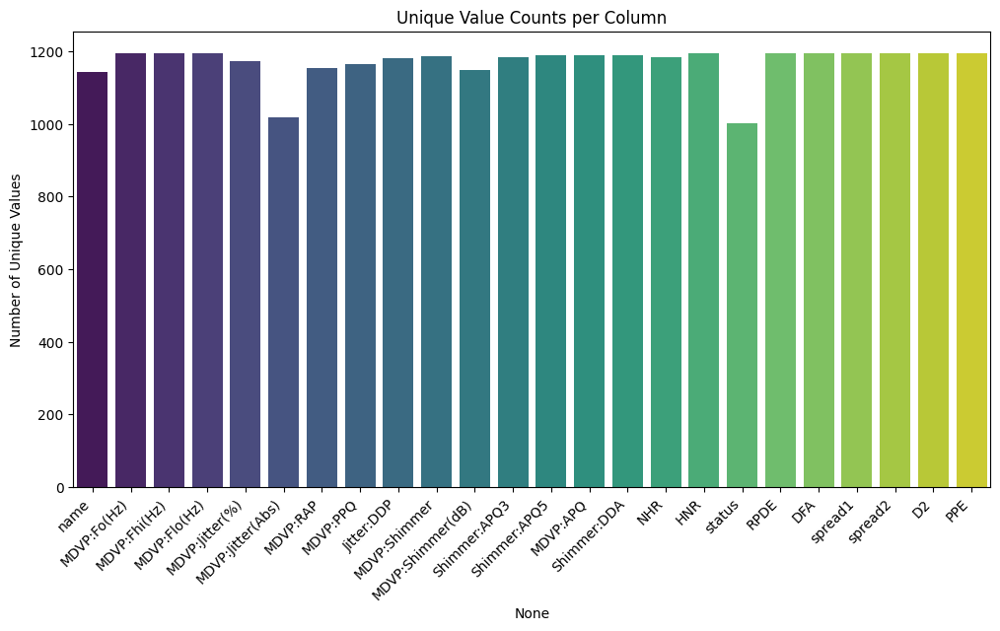

In [21]:
unique_counts = df.nunique()
plt.figure(figsize=(12, 6))
sns.barplot(x=unique_counts.index, y=unique_counts.values, palette="viridis")
plt.title("Unique Value Counts per Column")
plt.xticks(rotation=45, ha="right")
plt.ylabel("Number of Unique Values")
plt.show()

Visualize unique value counts for each column


In [23]:
zero_variance_cols = [col for col in df.columns if df[col].nunique() == 1]
print("\nColumns with zero variance:", zero_variance_cols)


Columns with zero variance: []


Detect mixed data types or zero-variance features

# Handling Missing Data

In [26]:
import missingno as msno

In [27]:
print("Missing values in each column:")
print(df.isnull().sum())

Missing values in each column:
name                0
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR                 0
status              0
RPDE                0
DFA                 0
spread1             0
spread2             0
D2                  0
PPE                 0
dtype: int64


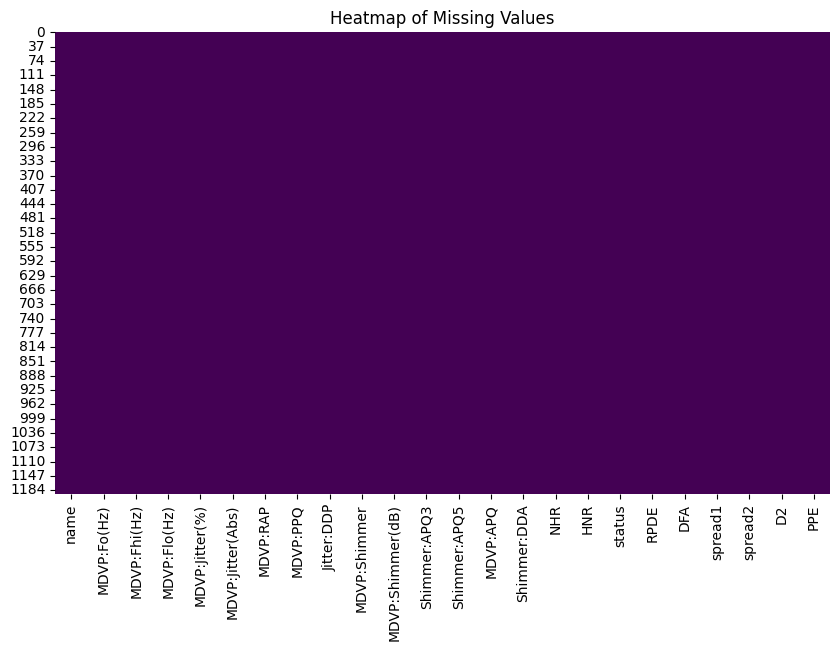

In [33]:
# Visualize missing values with a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title("Heatmap of Missing Values")
plt.show()


Missing value matrix:


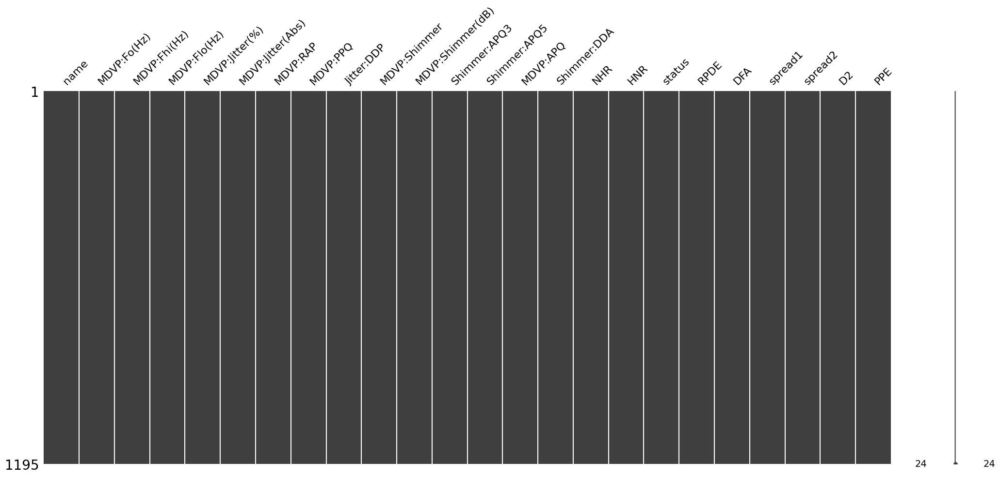

In [34]:
# Visualize missing data with missingno (matrix or bar plot)
print("\nMissing value matrix:")
msno.matrix(df)
plt.show()


Bar plot of missing values:


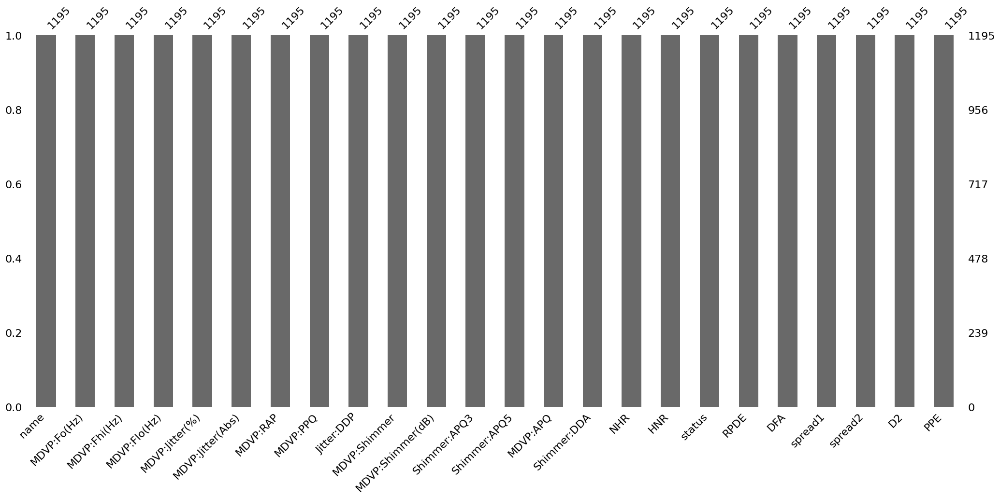

In [35]:
print("\nBar plot of missing values:")
msno.bar(df)
plt.show()

In [37]:
print(pd.isnull(df).sum())

name                0
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR                 0
status              0
RPDE                0
DFA                 0
spread1             0
spread2             0
D2                  0
PPE                 0
dtype: int64


Although it means there are no standard NaN or None values in our dataset. However, some datasets may have missing values encoded in non-standard ways like **' ', 'NA', 'N/A', '?' or others.**

In [39]:
# Check for empty strings or other placeholders
print("Checking for empty strings (''):")
print((df == '').sum())

# Check for specific placeholders (e.g., 'NA', 'N/A', '?')
placeholders = ['NA', 'N/A', '?', '-']
for placeholder in placeholders:
    print(f"Checking for '{placeholder}':")
    print((df == placeholder).sum())

Checking for empty strings (''):
name                0
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR                 0
status              0
RPDE                0
DFA                 0
spread1             0
spread2             0
D2                  0
PPE                 0
dtype: int64
Checking for 'NA':
name                0
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR                 0
status              0
RPDE       

We could see, there are no specific placeholders or empty strings

# Identifying and Removing Duplicates

Let's remove redundant rows now.

In [41]:
# Check for duplicate rows
duplicate_rows = df.duplicated()
print(f"Number of duplicate rows: {duplicate_rows.sum()}")

Number of duplicate rows: 0


No duplicate rows found.


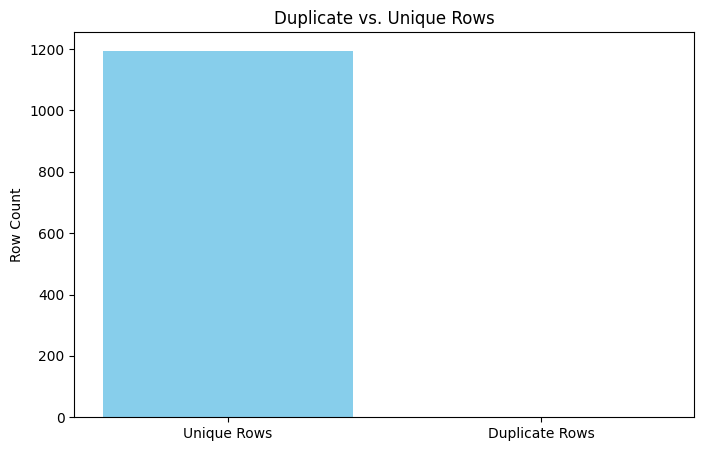

In [42]:
# Calculate counts for unique and duplicate rows
total_rows = len(df)
unique_rows = total_rows - duplicate_rows.sum()

# Data for plotting
labels = ['Unique Rows', 'Duplicate Rows']
counts = [unique_rows, duplicate_rows.sum()]

# Create a bar plot
plt.figure(figsize=(8, 5))
plt.bar(labels, counts, color=['skyblue', 'orange'])
plt.title("Duplicate vs. Unique Rows")
plt.ylabel("Row Count")
plt.show()

# Finding Outliers

Let's identify and handle extreme values.
We will use Interquartile Range (IQR) method.

In [43]:
# Define a function to calculate outliers using IQR
def detect_outliers_iqr(column):
    Q1 = column.quantile(0.25)  # First quartile
    Q3 = column.quantile(0.75)  # Third quartile
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return (column < lower_bound) | (column > upper_bound)

# Apply the function to numeric columns
outliers_iqr = df.select_dtypes(include=['float64', 'int64']).apply(detect_outliers_iqr)

# Count outliers per column
print("Outliers detected using IQR:")
print(outliers_iqr.sum())

Outliers detected using IQR:
MDVP:Fo(Hz)         159
MDVP:Fhi(Hz)        143
MDVP:Flo(Hz)        149
MDVP:Jitter(%)      123
MDVP:Jitter(Abs)    151
MDVP:RAP            117
MDVP:PPQ            128
Jitter:DDP          126
MDVP:Shimmer        154
MDVP:Shimmer(dB)    147
Shimmer:APQ3        143
Shimmer:APQ5        156
MDVP:APQ            149
Shimmer:DDA         144
NHR                 123
HNR                 145
status              197
RPDE                162
DFA                 154
spread1             141
spread2             148
D2                  141
PPE                 143
dtype: int64


Now we will Replace outliers with the upper/lower bound.

In [44]:
for col in df.select_dtypes(include=['float64', 'int64']).columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)

Now we Drop rows where outliers are detected.

In [45]:
# Drop rows with any outliers detected using IQR
df_cleaned = df[~outliers_iqr.any(axis=1)]

Now we Visualize Outliers using Boxplot

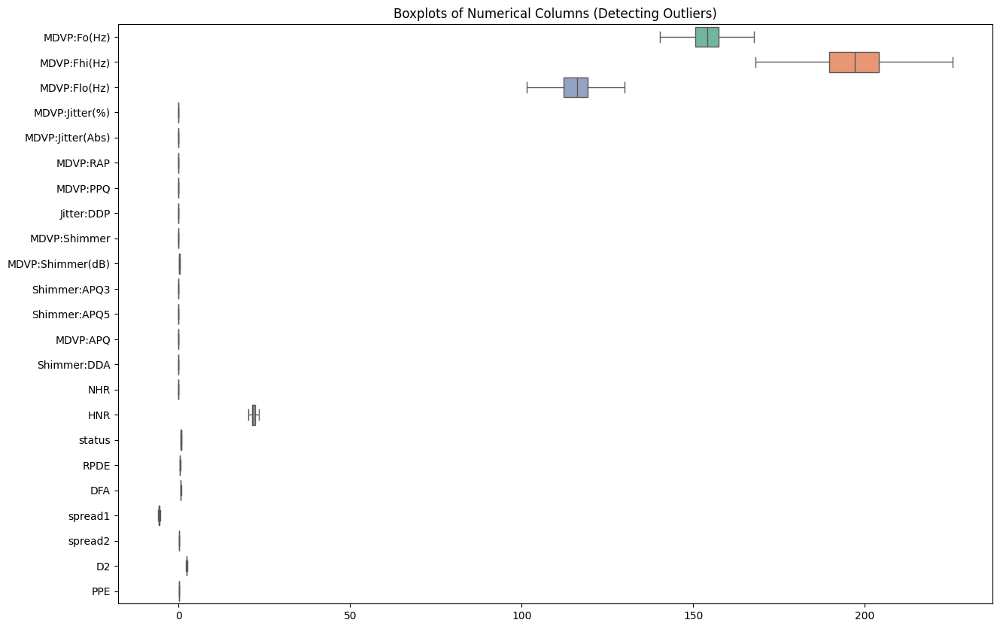

In [46]:
# Create boxplots for each numeric column
plt.figure(figsize=(15, 10))
sns.boxplot(data=df.select_dtypes(include=['float64', 'int64']), orient='h', palette='Set2')
plt.title("Boxplots of Numerical Columns (Detecting Outliers)")
plt.show()

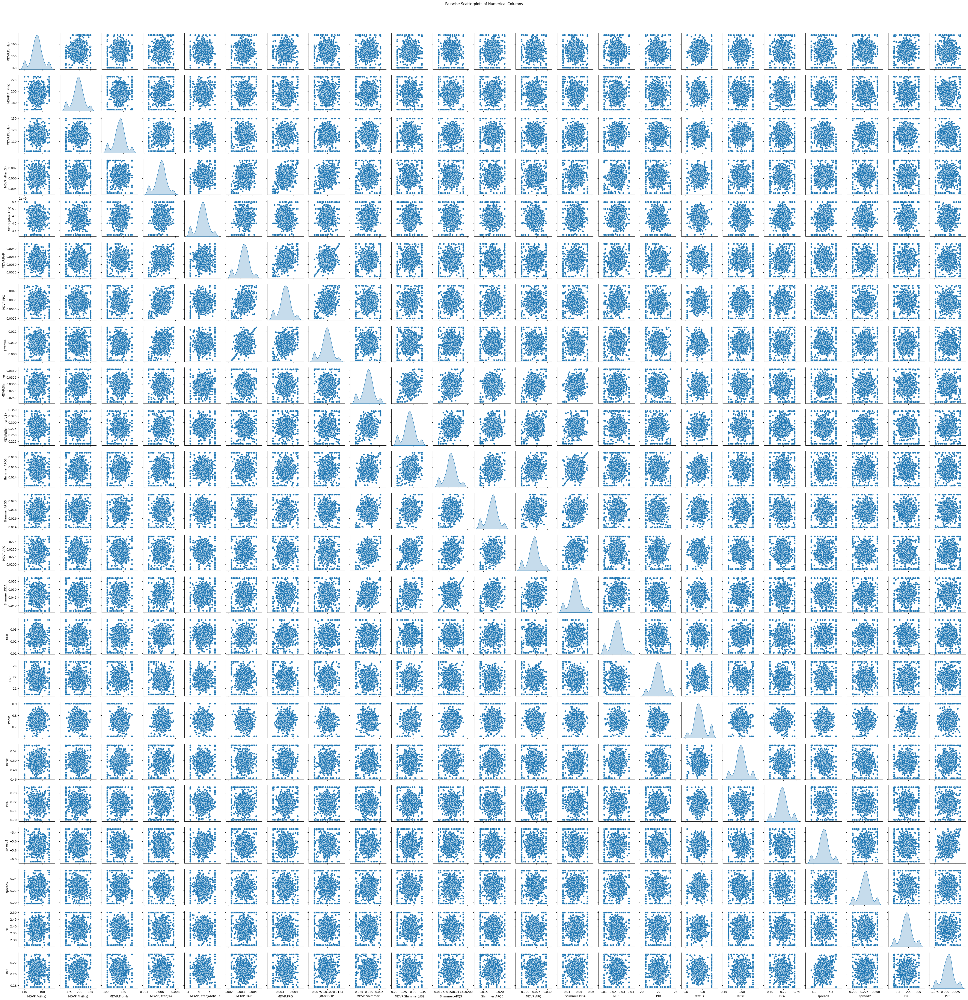

In [49]:
# Generate pairwise scatterplots
sns.pairplot(df.select_dtypes(include=['float64', 'int64']), diag_kind='kde', height=2)

# Customize title (optional)
plt.suptitle("Pairwise Scatterplots of Numerical Columns", y=1.02)
plt.show()

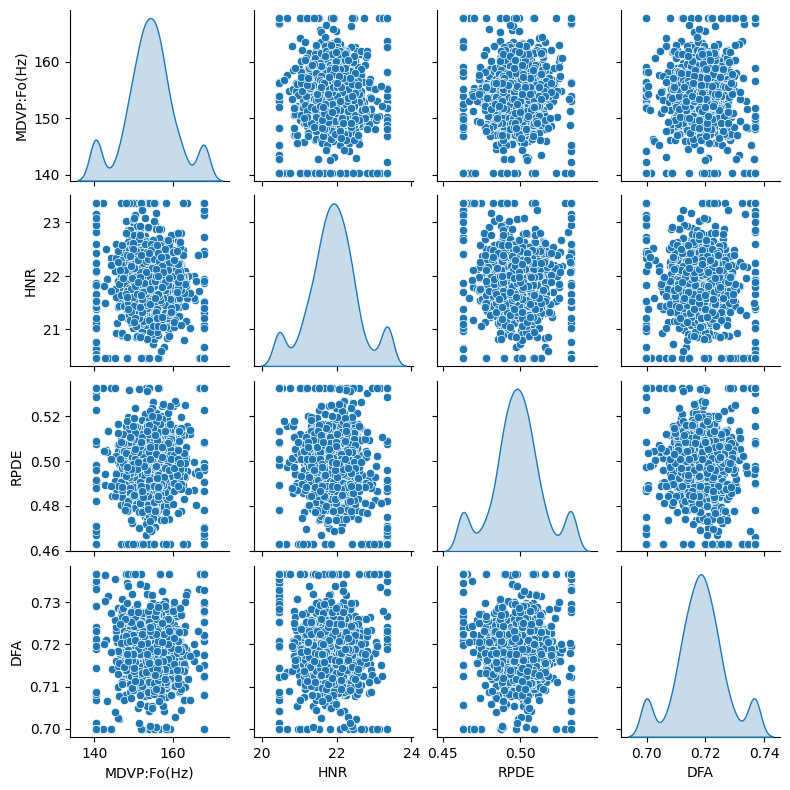

In [51]:
columns_to_plot = ['MDVP:Fo(Hz)', 'HNR', 'RPDE', 'DFA']
sns.pairplot(df[columns_to_plot], diag_kind='kde', height=2)
plt.show()

We can create plots with less number of columns too, to look clearly.

# Analysing the Distribution of data

Let's check for Skewness, *Skewness indicates how symmetric a distribution is. Values closer to 0 suggest a normal distribution, while high positive/negative values indicate skewness.*

In [54]:
skewness = df.select_dtypes(include=['float64', 'int64']).skew()
print("Skewness of numerical columns:")
print(skewness)

Skewness of numerical columns:
MDVP:Fo(Hz)        -0.059304
MDVP:Fhi(Hz)       -0.209278
MDVP:Flo(Hz)       -0.229653
MDVP:Jitter(%)     -0.263733
MDVP:Jitter(Abs)   -0.260061
MDVP:RAP           -0.313061
MDVP:PPQ           -0.251312
Jitter:DDP         -0.297108
MDVP:Shimmer       -0.245619
MDVP:Shimmer(dB)   -0.216262
Shimmer:APQ3       -0.179063
Shimmer:APQ5       -0.256043
MDVP:APQ           -0.241757
Shimmer:DDA        -0.205742
NHR                -0.402148
HNR                 0.054865
status              0.388935
RPDE               -0.006461
DFA                 0.009140
spread1            -0.095604
spread2            -0.065149
D2                 -0.078259
PPE                -0.134332
dtype: float64


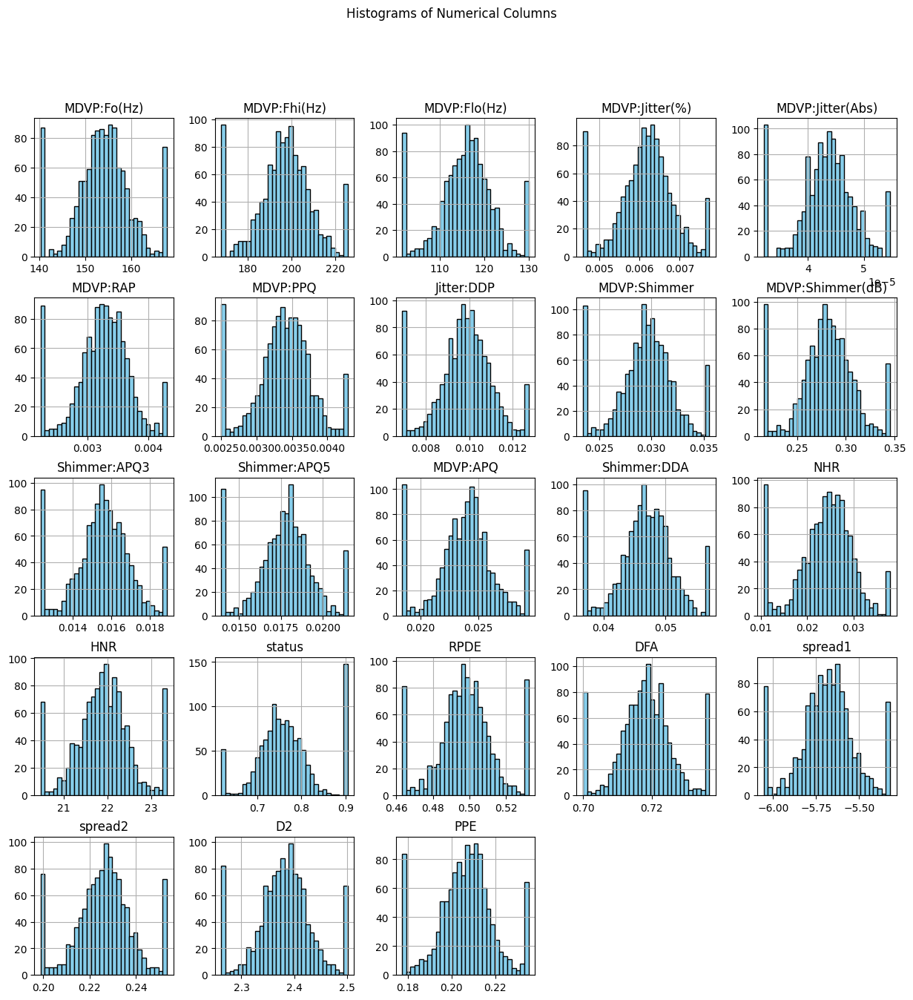

In [58]:
# histograms for numerical columns
df.select_dtypes(include=['float64', 'int64']).hist(figsize=(15, 15), bins=30, color='skyblue', edgecolor='black')
plt.suptitle("Histograms of Numerical Columns")
plt.show()

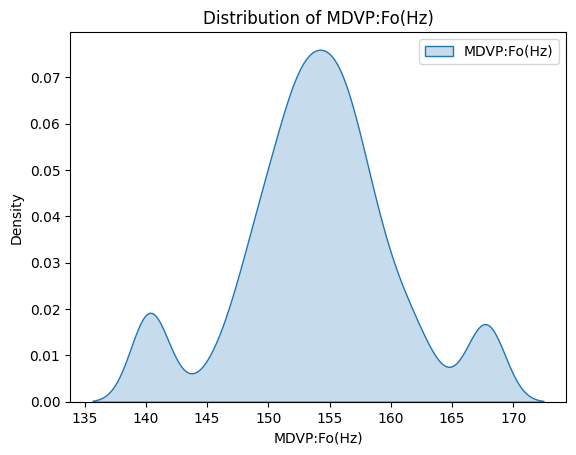

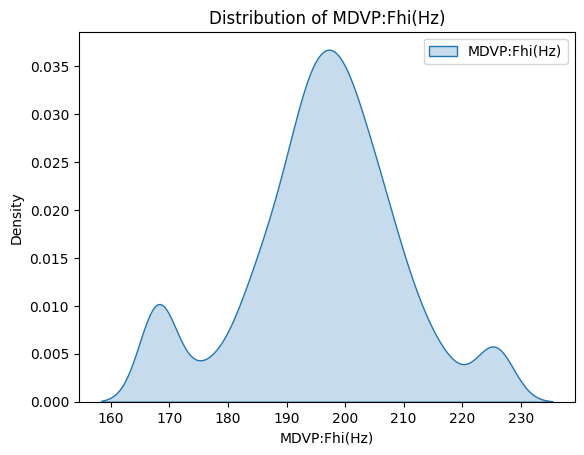

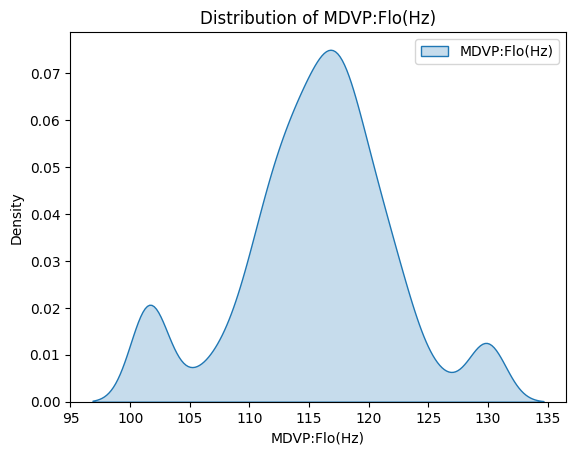

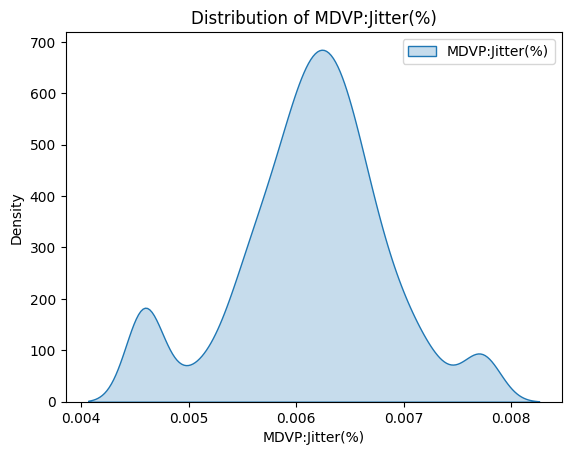

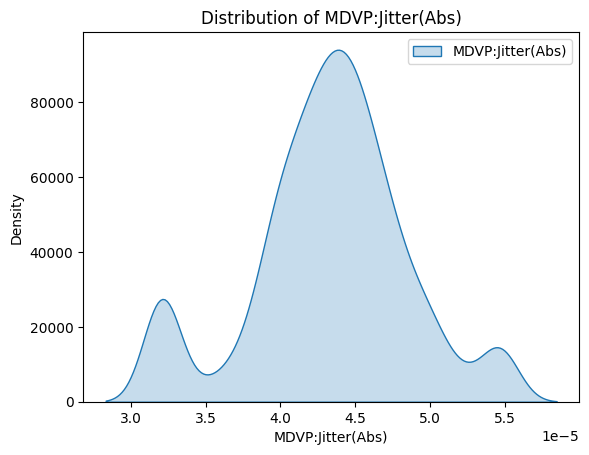

...

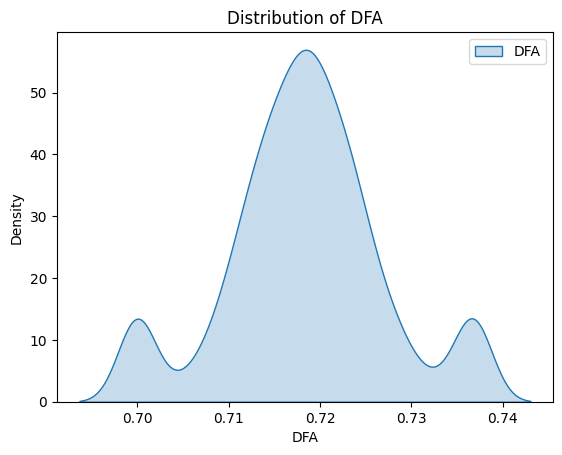

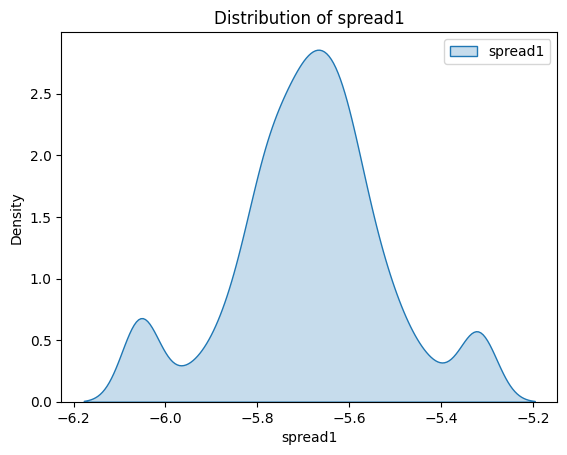

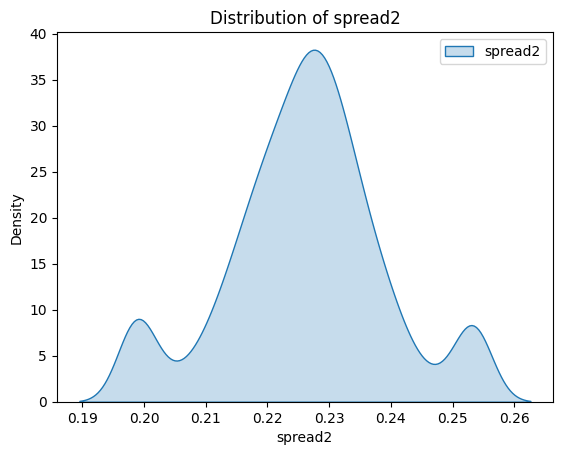

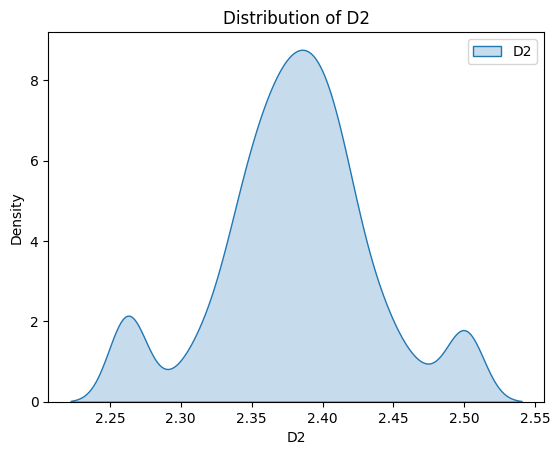

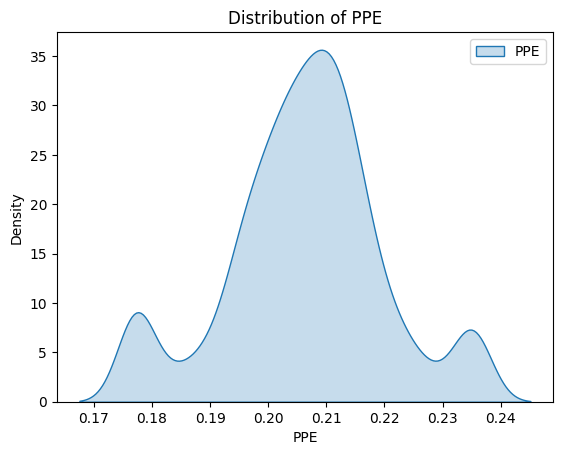

In [64]:
for column in df.columns:
    if df[column].dtype in ['int64', 'float64']:  # Only apply kdeplot for numerical columns
        sns.kdeplot(df[column], fill=True, label=column)
        plt.title(f'Distribution of {column}')
        plt.legend()
        plt.show()

Now we can do the transformations, after checking the columns which are skeweed

# Check for Logical Anomalies

Identify relationships or values that violate domain-specific rules. These anomalies may indicate issues like data entry errors, outliers, or conflicting information between related variables.

*   Check whether there are any conflicting relationships between dependent and independent variables. For example if there is a feature like "frequency" that cannot exceed a certain threshold.
*   If the data violates this rule (e.g., a frequency value higher than the maximum allowed frequency), it is an anomaly.

You may also want to ensure that the relationships between dependent variables align with domain-specific expectations. Eg. In financial data, check if negative revenue values are recorded where they shouldn't be.



# Class Imbalance

The aim of this step is to check for any imbalance in the distribution of the target variable. When classes are imbalanced, models tend to be biased towards the majority class.

Examine Class Distribution

In [67]:
# Display class distribution
class_counts = df['status'].value_counts()
print(class_counts)

status
0.904335    147
0.619274     50
0.746556      1
0.753302      1
0.743590      1
           ... 
0.790818      1
0.740938      1
0.758922      1
0.722024      1
0.735387      1
Name: count, Length: 1000, dtype: int64
